# Import the required libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from keras.layers import Dropout
import warnings 
warnings.filterwarnings('ignore')

# Read Data

In [2]:
# read the dataframe and make the id column in the csv file be the index of the rows in the dataframe
data_train = pd.read_csv('train.csv',index_col='id')

In [3]:
# view information about the dataset
data_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 990 entries, 1 to 1584
Columns: 193 entries, species to texture64
dtypes: float64(192), object(1)
memory usage: 1.5+ MB


In [4]:
# view the describtion of the dataset to see the count, mean, min, standrard deviation, and more
data_train.describe()

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,...,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,0.007167,0.018639,...,0.036501,0.005024,0.015944,0.011586,0.016108,0.014017,0.002688,0.020291,0.008989,0.019420
std,0.019739,0.038855,0.025847,0.028411,0.018390,0.052030,0.017511,0.002743,0.008933,0.016071,...,0.063403,0.019321,0.023214,0.025040,0.015335,0.060151,0.011415,0.039040,0.013791,0.022768
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.001953,0.001953,0.013672,0.005859,0.001953,0.000000,0.005859,0.000000,0.001953,0.005859,...,0.000000,0.000000,0.000977,0.000000,0.004883,0.000000,0.000000,0.000000,0.000000,0.000977
50%,0.009766,0.011719,0.025391,0.013672,0.007812,0.015625,0.015625,0.000000,0.005859,0.015625,...,0.004883,0.000000,0.005859,0.000977,0.012695,0.000000,0.000000,0.003906,0.002930,0.011719
75%,0.025391,0.041016,0.044922,0.029297,0.017578,0.056153,0.029297,0.000000,0.007812,0.027344,...,0.043701,0.000000,0.022217,0.009766,0.021484,0.000000,0.000000,0.023438,0.012695,0.029297
max,0.087891,0.205080,0.156250,0.169920,0.111330,0.310550,0.091797,0.031250,0.076172,0.097656,...,0.429690,0.202150,0.172850,0.200200,0.106450,0.578130,0.151370,0.375980,0.086914,0.141600


## Check if there is null values or duplicates rows

In [5]:
print('number of null values in data_train = ', data_train.isnull().any().sum())

number of null values in data_train =  0


In [6]:
print('number of duplicated values in data_train = ', data_train.duplicated().any().sum())

number of duplicated values in data_train =  0


## Get correlation between features

In [7]:
data_train.corr

<bound method DataFrame.corr of                     species   margin1   margin2   margin3   margin4   margin5  \
id                                                                              
1               Acer_Opalus  0.007812  0.023438  0.023438  0.003906  0.011719   
2     Pterocarya_Stenoptera  0.005859  0.000000  0.031250  0.015625  0.025391   
3      Quercus_Hartwissiana  0.005859  0.009766  0.019531  0.007812  0.003906   
5           Tilia_Tomentosa  0.000000  0.003906  0.023438  0.005859  0.021484   
6        Quercus_Variabilis  0.005859  0.003906  0.048828  0.009766  0.013672   
...                     ...       ...       ...       ...       ...       ...   
1575   Magnolia_Salicifolia  0.060547  0.119140  0.007812  0.003906  0.000000   
1578            Acer_Pictum  0.001953  0.003906  0.021484  0.107420  0.001953   
1581     Alnus_Maximowiczii  0.001953  0.003906  0.000000  0.021484  0.078125   
1582          Quercus_Rubra  0.000000  0.000000  0.046875  0.056641  0.009766

# Data visualization

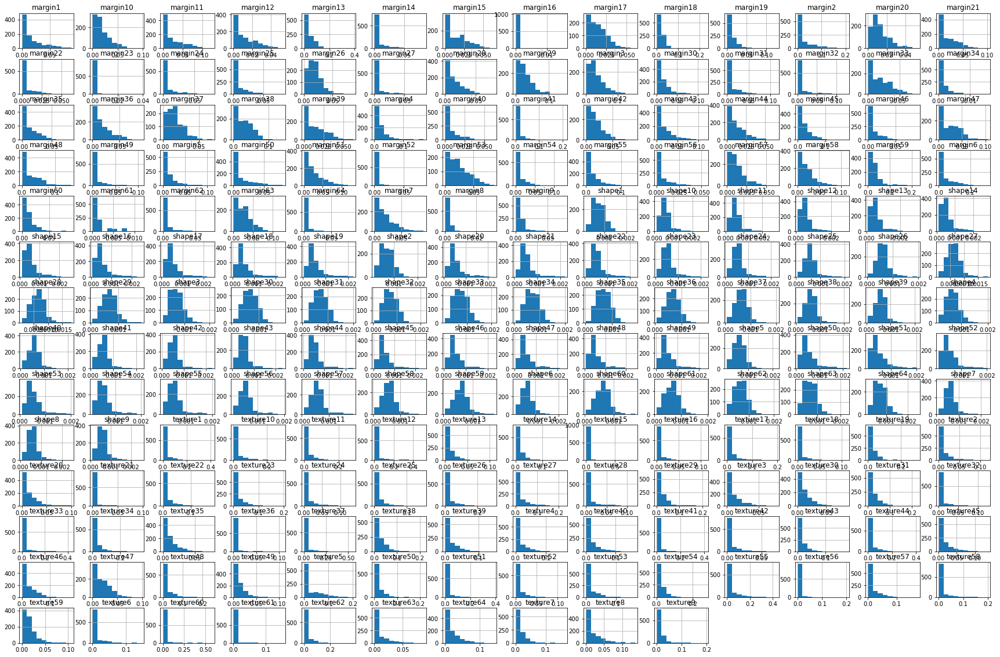

In [8]:
#plot histogram for the features
data_train.hist(bins=10, figsize=(30,20))
plt.show()

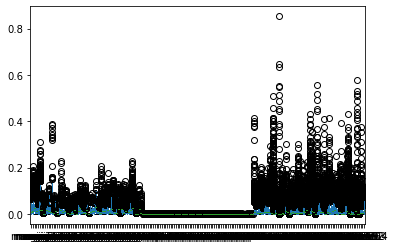

In [9]:
# Box plot to see whether there is outliers or not for all features
data_train.plot(kind='box')
plt.show()

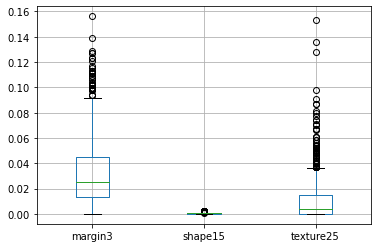

In [10]:
# Box plot for some features
boxplot = data_train.boxplot(column=['margin3', 'shape15', 'texture25'])

In [11]:
# get the correlation map between all features
corr = data_train.corr()
corr.style.background_gradient(cmap='coolwarm')

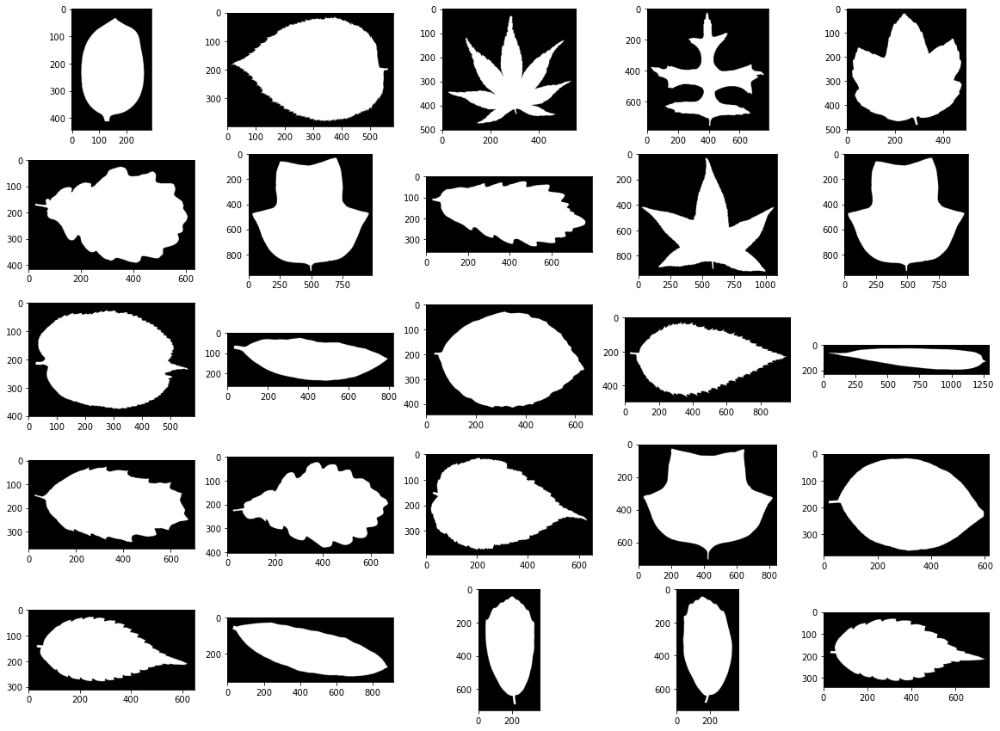

In [12]:
# visualize some of the images
import os
os.listdir()
os.chdir('images')
from keras.preprocessing.image import load_img

plt.figure(figsize=(20,15))

for i in range(25):
    randImg = np.random.choice(os.listdir())
    plt.subplot(5,5,i+1)
    img = load_img(os.path.join('C:\\Users\\fatma\\Downloads\\project deep\\images', randImg))
    plt.imshow(img)

## Convert species column to numerical data

In [13]:
from sklearn.preprocessing import LabelEncoder
from sklearn.compose import ColumnTransformer
data_train2 = data_train.copy()
el = LabelEncoder()
data_train2.loc[:, 'species'] = el.fit_transform(data_train2.loc[:, 'species'])

## Split labels from the data 

In [14]:
y = data_train2['species']
y.max()

98

In [15]:
x = data_train2.loc[:, data_train2.columns != 'species']
X_data = pd.DataFrame(x)
# get the info of the features dataframe
X_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 990 entries, 1 to 1584
Columns: 192 entries, margin1 to texture64
dtypes: float64(192)
memory usage: 1.5 MB


In [16]:
#divide data for train and test parts
X_train, X_test, y_train, y_test = train_test_split(X_data, y, test_size=0.2, random_state=42 , stratify=y)

In [17]:
# get the number of the inputs neurons
n_features = X_data.shape[1]
n_features

192

# Our model implementation

In [18]:
def our_model(hiddenLayers, batchSize, opt, dropRrate):
    model = Sequential()
    model.add(Dense(hiddenLayers, activation="tanh", input_shape = (n_features,), name= 'layer_1'))
    model.add(Dropout(dropRrate))
    model.add(Dense(len(np.unique(y_train)), activation="softmax", name= 'output'))
    model.summary()
    model.compile(optimizer=opt, loss="sparse_categorical_crossentropy", metrics='accuracy')
    history = model.fit(X_train, y_train, validation_split = 0.2, epochs = 150, batch_size = batchSize)
    return history, model

In [19]:
def evaluate_our_model(hiddenLayers, batchSize, opt, dropRrate, k):
    history, model = our_model(hiddenLayers, batchSize, opt, dropRrate)
    # summarize history for accuracy
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy for trial number: '+ str(k))
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='bottom right')
    plt.show()
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss for trial number: '+ str(k))
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    print("Evaluate the trial number: " + str(k))
    model.evaluate(X_test, y_test)
    return model

# Trials

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 100)               19300     
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 output (Dense)              (None, 99)                9999      
                                                                 
Total params: 29,299
Trainable params: 29,299
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
20/20 [==============================] - 0s 9ms/step - loss: 3.9907 - accuracy: 0.1548 - val_loss: 2.4672 - val_accuracy: 0.3774
Epoch 2/150
20/20 [==============================] - 0s 3ms/step - loss: 1.5498 - accuracy: 0.5750 - val_loss: 1.2985 - val_accuracy: 0.6038
Epoch 3/150
20/20 [===============

20/20 [==============================] - 0s 3ms/step - loss: 0.4727 - accuracy: 0.9573 - val_loss: 2.9071 - val_accuracy: 0.8491
Epoch 54/150
20/20 [==============================] - 0s 3ms/step - loss: 0.2514 - accuracy: 0.9716 - val_loss: 3.2793 - val_accuracy: 0.8428
Epoch 55/150
20/20 [==============================] - 0s 3ms/step - loss: 0.1490 - accuracy: 0.9826 - val_loss: 3.7826 - val_accuracy: 0.8491
Epoch 56/150
20/20 [==============================] - 0s 3ms/step - loss: 0.4607 - accuracy: 0.9700 - val_loss: 2.8305 - val_accuracy: 0.8491
Epoch 57/150
20/20 [==============================] - 0s 3ms/step - loss: 0.2581 - accuracy: 0.9731 - val_loss: 3.1998 - val_accuracy: 0.8491
Epoch 58/150
20/20 [==============================] - 0s 4ms/step - loss: 0.5542 - accuracy: 0.9652 - val_loss: 4.1071 - val_accuracy: 0.8113
Epoch 59/150
20/20 [==============================] - 0s 3ms/step - loss: 0.3160 - accuracy: 0.9573 - val_loss: 4.0274 - val_accuracy: 0.8050
Epoch 60/150
20/20 

20/20 [==============================] - 0s 3ms/step - loss: 0.0229 - accuracy: 0.9968 - val_loss: 4.1749 - val_accuracy: 0.8805
Epoch 111/150
20/20 [==============================] - 0s 3ms/step - loss: 0.0184 - accuracy: 0.9984 - val_loss: 4.7507 - val_accuracy: 0.8805
Epoch 112/150
20/20 [==============================] - 0s 3ms/step - loss: 0.0604 - accuracy: 0.9968 - val_loss: 4.9429 - val_accuracy: 0.8742
Epoch 113/150
20/20 [==============================] - 0s 3ms/step - loss: 0.0125 - accuracy: 0.9984 - val_loss: 4.8048 - val_accuracy: 0.8679
Epoch 114/150
20/20 [==============================] - 0s 3ms/step - loss: 0.1427 - accuracy: 0.9937 - val_loss: 4.3179 - val_accuracy: 0.8679
Epoch 115/150
20/20 [==============================] - 0s 3ms/step - loss: 0.0744 - accuracy: 0.9921 - val_loss: 4.8184 - val_accuracy: 0.8742
Epoch 116/150
20/20 [==============================] - 0s 3ms/step - loss: 0.1471 - accuracy: 0.9858 - val_loss: 5.8631 - val_accuracy: 0.8553
Epoch 117/150

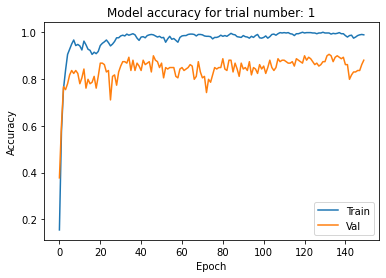

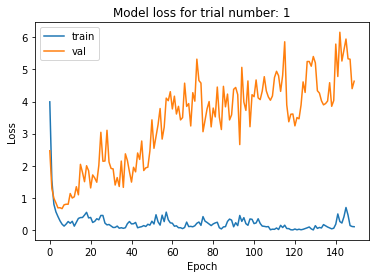

Evaluate the trial number: 1
7/7 [==============================] - 0s 1ms/step - loss: 4.3273 - accuracy: 0.8333


In [20]:
# trial 1
model = evaluate_our_model(100, 32, tf.keras.optimizers.Adam(learning_rate = 0.1), 0, 1)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 100)               19300     
                                                                 
 dropout_1 (Dropout)         (None, 100)               0         
                                                                 
 output (Dense)              (None, 99)                9999      
                                                                 
Total params: 29,299
Trainable params: 29,299
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
10/10 [==============================] - 1s 35ms/step - loss: 4.3390 - accuracy: 0.0742 - val_loss: 2.9171 - val_accuracy: 0.2264
Epoch 2/150
10/10 [==============================] - 0s 5ms/step - loss: 1.9778 - accuracy: 0.4755 - val_loss: 1.8303 - val_accuracy: 0.5031
Epoch 3/150
10/10 [============

10/10 [==============================] - 0s 4ms/step - loss: 5.1082e-04 - accuracy: 1.0000 - val_loss: 0.4039 - val_accuracy: 0.9057
Epoch 53/150
10/10 [==============================] - 0s 4ms/step - loss: 4.9850e-04 - accuracy: 1.0000 - val_loss: 0.4039 - val_accuracy: 0.9057
Epoch 54/150
10/10 [==============================] - 0s 5ms/step - loss: 4.8809e-04 - accuracy: 1.0000 - val_loss: 0.4043 - val_accuracy: 0.9057
Epoch 55/150
10/10 [==============================] - 0s 5ms/step - loss: 4.7860e-04 - accuracy: 1.0000 - val_loss: 0.4041 - val_accuracy: 0.9057
Epoch 56/150
10/10 [==============================] - 0s 5ms/step - loss: 4.6830e-04 - accuracy: 1.0000 - val_loss: 0.4045 - val_accuracy: 0.9057
Epoch 57/150
10/10 [==============================] - 0s 4ms/step - loss: 4.5770e-04 - accuracy: 1.0000 - val_loss: 0.4041 - val_accuracy: 0.9057
Epoch 58/150
10/10 [==============================] - 0s 5ms/step - loss: 4.4798e-04 - accuracy: 1.0000 - val_loss: 0.4038 - val_accuracy

10/10 [==============================] - 0s 5ms/step - loss: 1.9477e-04 - accuracy: 1.0000 - val_loss: 0.4042 - val_accuracy: 0.9057
Epoch 109/150
10/10 [==============================] - 0s 4ms/step - loss: 1.9172e-04 - accuracy: 1.0000 - val_loss: 0.4041 - val_accuracy: 0.9057
Epoch 110/150
10/10 [==============================] - 0s 5ms/step - loss: 1.8916e-04 - accuracy: 1.0000 - val_loss: 0.4034 - val_accuracy: 0.9057
Epoch 111/150
10/10 [==============================] - 0s 5ms/step - loss: 1.8665e-04 - accuracy: 1.0000 - val_loss: 0.4040 - val_accuracy: 0.9057
Epoch 112/150
10/10 [==============================] - 0s 5ms/step - loss: 1.8415e-04 - accuracy: 1.0000 - val_loss: 0.4037 - val_accuracy: 0.9057
Epoch 113/150
10/10 [==============================] - 0s 4ms/step - loss: 1.8137e-04 - accuracy: 1.0000 - val_loss: 0.4041 - val_accuracy: 0.9057
Epoch 114/150
10/10 [==============================] - 0s 5ms/step - loss: 1.7891e-04 - accuracy: 1.0000 - val_loss: 0.4046 - val_ac

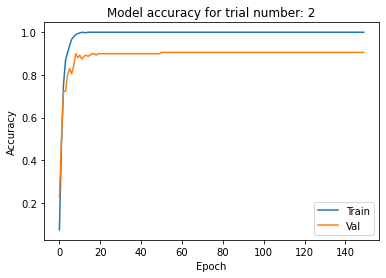

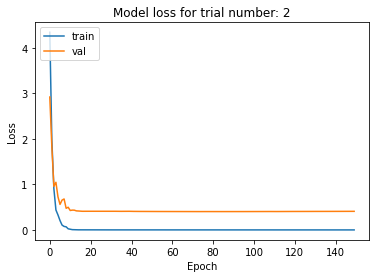

Evaluate the trial number: 2
7/7 [==============================] - 0s 2ms/step - loss: 0.1847 - accuracy: 0.9343


In [21]:
# trial 2
model = evaluate_our_model(100, 64, tf.keras.optimizers.Adam(learning_rate = 0.1), 0, 2)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 100)               19300     
                                                                 
 dropout_2 (Dropout)         (None, 100)               0         
                                                                 
 output (Dense)              (None, 99)                9999      
                                                                 
Total params: 29,299
Trainable params: 29,299
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
5/5 [==============================] - 0s 47ms/step - loss: 4.3232 - accuracy: 0.1011 - val_loss: 4.3299 - val_accuracy: 0.0755
Epoch 2/150
5/5 [==============================] - 0s 9ms/step - loss: 2.6830 - accuracy: 0.3365 - val_loss: 2.3669 - val_accuracy: 0.4151
Epoch 3/150
5/5 [==================

5/5 [==============================] - 0s 10ms/step - loss: 9.0988e-04 - accuracy: 1.0000 - val_loss: 0.4219 - val_accuracy: 0.9119
Epoch 54/150
5/5 [==============================] - 0s 10ms/step - loss: 8.8796e-04 - accuracy: 1.0000 - val_loss: 0.4228 - val_accuracy: 0.9119
Epoch 55/150
5/5 [==============================] - 0s 10ms/step - loss: 8.6980e-04 - accuracy: 1.0000 - val_loss: 0.4222 - val_accuracy: 0.9119
Epoch 56/150
5/5 [==============================] - 0s 10ms/step - loss: 8.5118e-04 - accuracy: 1.0000 - val_loss: 0.4226 - val_accuracy: 0.9119
Epoch 57/150
5/5 [==============================] - 0s 10ms/step - loss: 8.3348e-04 - accuracy: 1.0000 - val_loss: 0.4235 - val_accuracy: 0.9119
Epoch 58/150
5/5 [==============================] - 0s 10ms/step - loss: 8.1574e-04 - accuracy: 1.0000 - val_loss: 0.4226 - val_accuracy: 0.9119
Epoch 59/150
5/5 [==============================] - 0s 9ms/step - loss: 7.9844e-04 - accuracy: 1.0000 - val_loss: 0.4225 - val_accuracy: 0.9119

5/5 [==============================] - 0s 8ms/step - loss: 3.4931e-04 - accuracy: 1.0000 - val_loss: 0.4298 - val_accuracy: 0.9182
Epoch 110/150
5/5 [==============================] - 0s 10ms/step - loss: 3.4524e-04 - accuracy: 1.0000 - val_loss: 0.4301 - val_accuracy: 0.9182
Epoch 111/150
5/5 [==============================] - 0s 9ms/step - loss: 3.4025e-04 - accuracy: 1.0000 - val_loss: 0.4300 - val_accuracy: 0.9182
Epoch 112/150
5/5 [==============================] - 0s 9ms/step - loss: 3.3601e-04 - accuracy: 1.0000 - val_loss: 0.4301 - val_accuracy: 0.9182
Epoch 113/150
5/5 [==============================] - 0s 7ms/step - loss: 3.3134e-04 - accuracy: 1.0000 - val_loss: 0.4303 - val_accuracy: 0.9182
Epoch 114/150
5/5 [==============================] - 0s 9ms/step - loss: 3.2728e-04 - accuracy: 1.0000 - val_loss: 0.4302 - val_accuracy: 0.9182
Epoch 115/150
5/5 [==============================] - 0s 8ms/step - loss: 3.2324e-04 - accuracy: 1.0000 - val_loss: 0.4306 - val_accuracy: 0.918

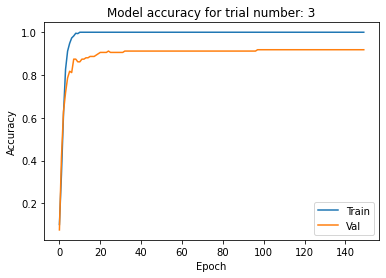

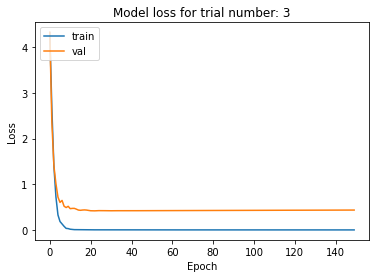

Evaluate the trial number: 3
7/7 [==============================] - 0s 2ms/step - loss: 0.1175 - accuracy: 0.9646


In [22]:
# trial 3
model = evaluate_our_model(100, 128, tf.keras.optimizers.Adam(learning_rate = 0.1), 0, 3)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 200)               38600     
                                                                 
 dropout_3 (Dropout)         (None, 200)               0         
                                                                 
 output (Dense)              (None, 99)                19899     
                                                                 
Total params: 58,499
Trainable params: 58,499
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
5/5 [==============================] - 0s 35ms/step - loss: 4.8622 - accuracy: 0.0806 - val_loss: 4.2146 - val_accuracy: 0.1698
Epoch 2/150
5/5 [==============================] - 0s 11ms/step - loss: 2.9555 - accuracy: 0.3175 - val_loss: 2.2408 - val_accuracy: 0.4591
Epoch 3/150
5/5 [=================

5/5 [==============================] - 0s 9ms/step - loss: 7.5105e-04 - accuracy: 1.0000 - val_loss: 0.4495 - val_accuracy: 0.8994
Epoch 54/150
5/5 [==============================] - 0s 8ms/step - loss: 7.3452e-04 - accuracy: 1.0000 - val_loss: 0.4496 - val_accuracy: 0.8994
Epoch 55/150
5/5 [==============================] - 0s 9ms/step - loss: 7.1757e-04 - accuracy: 1.0000 - val_loss: 0.4499 - val_accuracy: 0.8994
Epoch 56/150
5/5 [==============================] - 0s 9ms/step - loss: 7.0611e-04 - accuracy: 1.0000 - val_loss: 0.4504 - val_accuracy: 0.8994
Epoch 57/150
5/5 [==============================] - 0s 12ms/step - loss: 6.8927e-04 - accuracy: 1.0000 - val_loss: 0.4510 - val_accuracy: 0.8994
Epoch 58/150
5/5 [==============================] - 0s 12ms/step - loss: 6.7629e-04 - accuracy: 1.0000 - val_loss: 0.4516 - val_accuracy: 0.8994
Epoch 59/150
5/5 [==============================] - 0s 10ms/step - loss: 6.6232e-04 - accuracy: 1.0000 - val_loss: 0.4523 - val_accuracy: 0.8994
Ep

Epoch 110/150
5/5 [==============================] - 0s 9ms/step - loss: 2.9439e-04 - accuracy: 1.0000 - val_loss: 0.4631 - val_accuracy: 0.8994
Epoch 111/150
5/5 [==============================] - 0s 9ms/step - loss: 2.9055e-04 - accuracy: 1.0000 - val_loss: 0.4633 - val_accuracy: 0.8994
Epoch 112/150
5/5 [==============================] - 0s 9ms/step - loss: 2.8729e-04 - accuracy: 1.0000 - val_loss: 0.4632 - val_accuracy: 0.8994
Epoch 113/150
5/5 [==============================] - 0s 10ms/step - loss: 2.8313e-04 - accuracy: 1.0000 - val_loss: 0.4636 - val_accuracy: 0.8994
Epoch 114/150
5/5 [==============================] - 0s 9ms/step - loss: 2.7970e-04 - accuracy: 1.0000 - val_loss: 0.4641 - val_accuracy: 0.8994
Epoch 115/150
5/5 [==============================] - 0s 10ms/step - loss: 2.7633e-04 - accuracy: 1.0000 - val_loss: 0.4642 - val_accuracy: 0.8994
Epoch 116/150
5/5 [==============================] - 0s 11ms/step - loss: 2.7261e-04 - accuracy: 1.0000 - val_loss: 0.4644 - val

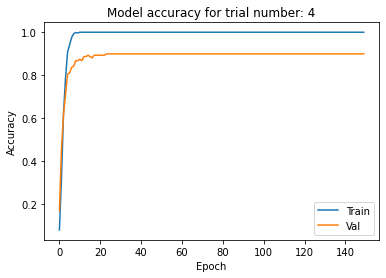

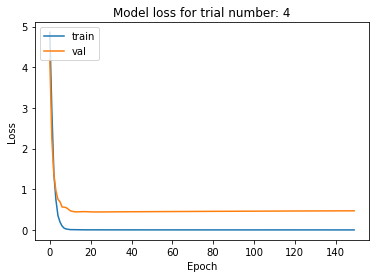

Evaluate the trial number: 4
7/7 [==============================] - 0s 2ms/step - loss: 0.2257 - accuracy: 0.9444


In [23]:
# trial 4
model = evaluate_our_model(200, 128, tf.keras.optimizers.Adam(learning_rate = 0.1), 0, 4)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 300)               57900     
                                                                 
 dropout_4 (Dropout)         (None, 300)               0         
                                                                 
 output (Dense)              (None, 99)                29799     
                                                                 
Total params: 87,699
Trainable params: 87,699
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
5/5 [==============================] - 0s 36ms/step - loss: 5.3946 - accuracy: 0.0585 - val_loss: 3.6995 - val_accuracy: 0.1509
Epoch 2/150
5/5 [==============================] - 0s 11ms/step - loss: 3.0909 - accuracy: 0.2938 - val_loss: 2.6790 - val_accuracy: 0.4025
Epoch 3/150
5/5 [=================

Epoch 53/150
5/5 [==============================] - 0s 12ms/step - loss: 4.5686e-04 - accuracy: 1.0000 - val_loss: 0.5121 - val_accuracy: 0.8616
Epoch 54/150
5/5 [==============================] - 0s 12ms/step - loss: 4.4929e-04 - accuracy: 1.0000 - val_loss: 0.5117 - val_accuracy: 0.8616
Epoch 55/150
5/5 [==============================] - 0s 9ms/step - loss: 4.4248e-04 - accuracy: 1.0000 - val_loss: 0.5121 - val_accuracy: 0.8616
Epoch 56/150
5/5 [==============================] - 0s 9ms/step - loss: 4.3399e-04 - accuracy: 1.0000 - val_loss: 0.5118 - val_accuracy: 0.8616
Epoch 57/150
5/5 [==============================] - 0s 9ms/step - loss: 4.2661e-04 - accuracy: 1.0000 - val_loss: 0.5114 - val_accuracy: 0.8679
Epoch 58/150
5/5 [==============================] - 0s 9ms/step - loss: 4.2045e-04 - accuracy: 1.0000 - val_loss: 0.5118 - val_accuracy: 0.8679
Epoch 59/150
5/5 [==============================] - 0s 9ms/step - loss: 4.1359e-04 - accuracy: 1.0000 - val_loss: 0.5118 - val_accurac

Epoch 110/150
5/5 [==============================] - 0s 9ms/step - loss: 2.0974e-04 - accuracy: 1.0000 - val_loss: 0.5139 - val_accuracy: 0.8805
Epoch 111/150
5/5 [==============================] - 0s 9ms/step - loss: 2.0758e-04 - accuracy: 1.0000 - val_loss: 0.5139 - val_accuracy: 0.8805
Epoch 112/150
5/5 [==============================] - 0s 9ms/step - loss: 2.0530e-04 - accuracy: 1.0000 - val_loss: 0.5139 - val_accuracy: 0.8805
Epoch 113/150
5/5 [==============================] - 0s 9ms/step - loss: 2.0297e-04 - accuracy: 1.0000 - val_loss: 0.5136 - val_accuracy: 0.8805
Epoch 114/150
5/5 [==============================] - 0s 8ms/step - loss: 2.0091e-04 - accuracy: 1.0000 - val_loss: 0.5135 - val_accuracy: 0.8805
Epoch 115/150
5/5 [==============================] - 0s 10ms/step - loss: 1.9888e-04 - accuracy: 1.0000 - val_loss: 0.5137 - val_accuracy: 0.8805
Epoch 116/150
5/5 [==============================] - 0s 9ms/step - loss: 1.9672e-04 - accuracy: 1.0000 - val_loss: 0.5135 - val_a

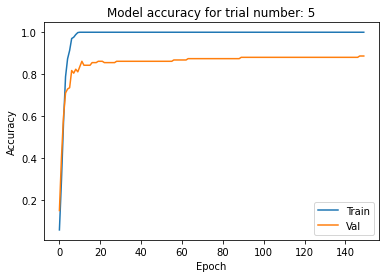

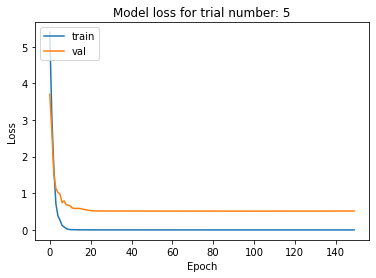

Evaluate the trial number: 5
7/7 [==============================] - 0s 2ms/step - loss: 0.2870 - accuracy: 0.9394


In [24]:
# trial 5
model = evaluate_our_model(300, 128, tf.keras.optimizers.Adam(learning_rate = 0.1), 0, 5)

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 400)               77200     
                                                                 
 dropout_5 (Dropout)         (None, 400)               0         
                                                                 
 output (Dense)              (None, 99)                39699     
                                                                 
Total params: 116,899
Trainable params: 116,899
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
5/5 [==============================] - 0s 38ms/step - loss: 6.4056 - accuracy: 0.0553 - val_loss: 10.3248 - val_accuracy: 0.0377
Epoch 2/150
5/5 [==============================] - 0s 12ms/step - loss: 5.2045 - accuracy: 0.2480 - val_loss: 3.1179 - val_accuracy: 0.3774
Epoch 3/150
5/5 [==============

5/5 [==============================] - 0s 9ms/step - loss: 3.6444e-04 - accuracy: 1.0000 - val_loss: 0.4329 - val_accuracy: 0.8994
Epoch 53/150
5/5 [==============================] - 0s 9ms/step - loss: 3.5903e-04 - accuracy: 1.0000 - val_loss: 0.4329 - val_accuracy: 0.8994
Epoch 54/150
5/5 [==============================] - 0s 9ms/step - loss: 3.5421e-04 - accuracy: 1.0000 - val_loss: 0.4323 - val_accuracy: 0.8994
Epoch 55/150
5/5 [==============================] - 0s 9ms/step - loss: 3.4872e-04 - accuracy: 1.0000 - val_loss: 0.4321 - val_accuracy: 0.8994
Epoch 56/150
5/5 [==============================] - 0s 9ms/step - loss: 3.4353e-04 - accuracy: 1.0000 - val_loss: 0.4322 - val_accuracy: 0.8994
Epoch 57/150
5/5 [==============================] - 0s 9ms/step - loss: 3.3878e-04 - accuracy: 1.0000 - val_loss: 0.4316 - val_accuracy: 0.8994
Epoch 58/150
5/5 [==============================] - 0s 9ms/step - loss: 3.3382e-04 - accuracy: 1.0000 - val_loss: 0.4314 - val_accuracy: 0.8994
Epoch

Epoch 109/150
5/5 [==============================] - 0s 12ms/step - loss: 1.8436e-04 - accuracy: 1.0000 - val_loss: 0.4261 - val_accuracy: 0.9057
Epoch 110/150
5/5 [==============================] - 0s 11ms/step - loss: 1.8254e-04 - accuracy: 1.0000 - val_loss: 0.4261 - val_accuracy: 0.9057
Epoch 111/150
5/5 [==============================] - 0s 10ms/step - loss: 1.8083e-04 - accuracy: 1.0000 - val_loss: 0.4262 - val_accuracy: 0.9057
Epoch 112/150
5/5 [==============================] - 0s 9ms/step - loss: 1.7920e-04 - accuracy: 1.0000 - val_loss: 0.4261 - val_accuracy: 0.9057
Epoch 113/150
5/5 [==============================] - 0s 9ms/step - loss: 1.7748e-04 - accuracy: 1.0000 - val_loss: 0.4257 - val_accuracy: 0.9057
Epoch 114/150
5/5 [==============================] - 0s 9ms/step - loss: 1.7575e-04 - accuracy: 1.0000 - val_loss: 0.4259 - val_accuracy: 0.9057
Epoch 115/150
5/5 [==============================] - 0s 8ms/step - loss: 1.7396e-04 - accuracy: 1.0000 - val_loss: 0.4259 - val

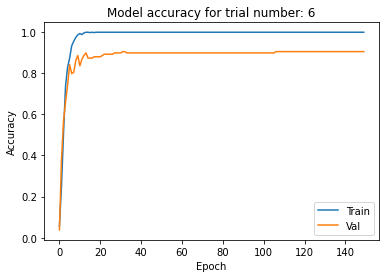

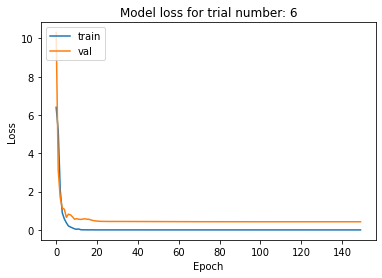

Evaluate the trial number: 6
7/7 [==============================] - 0s 2ms/step - loss: 0.2107 - accuracy: 0.9545


In [25]:
# trial 6
model = evaluate_our_model(400, 128, tf.keras.optimizers.Adam(learning_rate = 0.1), 0, 6)

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 400)               77200     
                                                                 
 dropout_6 (Dropout)         (None, 400)               0         
                                                                 
 output (Dense)              (None, 99)                39699     
                                                                 
Total params: 116,899
Trainable params: 116,899
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
5/5 [==============================] - 0s 33ms/step - loss: 4.5944 - accuracy: 0.0111 - val_loss: 4.5938 - val_accuracy: 0.0566
Epoch 2/150
5/5 [==============================] - 0s 9ms/step - loss: 4.5934 - accuracy: 0.0126 - val_loss: 4.5935 - val_accuracy: 0.0566
Epoch 3/150
5/5 [================

5/5 [==============================] - 0s 10ms/step - loss: 4.5415 - accuracy: 0.1690 - val_loss: 4.5781 - val_accuracy: 0.0377
Epoch 54/150
5/5 [==============================] - 0s 11ms/step - loss: 4.5405 - accuracy: 0.1754 - val_loss: 4.5777 - val_accuracy: 0.0377
Epoch 55/150
5/5 [==============================] - 0s 13ms/step - loss: 4.5395 - accuracy: 0.1738 - val_loss: 4.5774 - val_accuracy: 0.0377
Epoch 56/150
5/5 [==============================] - 0s 13ms/step - loss: 4.5384 - accuracy: 0.1754 - val_loss: 4.5770 - val_accuracy: 0.0440
Epoch 57/150
5/5 [==============================] - 0s 11ms/step - loss: 4.5373 - accuracy: 0.1801 - val_loss: 4.5767 - val_accuracy: 0.0503
Epoch 58/150
5/5 [==============================] - 0s 9ms/step - loss: 4.5363 - accuracy: 0.1833 - val_loss: 4.5763 - val_accuracy: 0.0566
Epoch 59/150
5/5 [==============================] - 0s 9ms/step - loss: 4.5352 - accuracy: 0.1833 - val_loss: 4.5760 - val_accuracy: 0.0566
Epoch 60/150
5/5 [==========

5/5 [==============================] - 0s 9ms/step - loss: 4.4766 - accuracy: 0.2496 - val_loss: 4.5543 - val_accuracy: 0.0629
Epoch 112/150
5/5 [==============================] - 0s 9ms/step - loss: 4.4754 - accuracy: 0.2480 - val_loss: 4.5538 - val_accuracy: 0.0629
Epoch 113/150
5/5 [==============================] - 0s 9ms/step - loss: 4.4741 - accuracy: 0.2480 - val_loss: 4.5533 - val_accuracy: 0.0629
Epoch 114/150
5/5 [==============================] - 0s 9ms/step - loss: 4.4729 - accuracy: 0.2464 - val_loss: 4.5528 - val_accuracy: 0.0692
Epoch 115/150
5/5 [==============================] - 0s 11ms/step - loss: 4.4717 - accuracy: 0.2464 - val_loss: 4.5523 - val_accuracy: 0.0692
Epoch 116/150
5/5 [==============================] - 0s 10ms/step - loss: 4.4705 - accuracy: 0.2496 - val_loss: 4.5518 - val_accuracy: 0.0692
Epoch 117/150
5/5 [==============================] - 0s 14ms/step - loss: 4.4692 - accuracy: 0.2449 - val_loss: 4.5513 - val_accuracy: 0.0692
Epoch 118/150
5/5 [=====

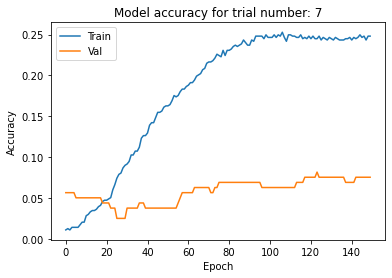

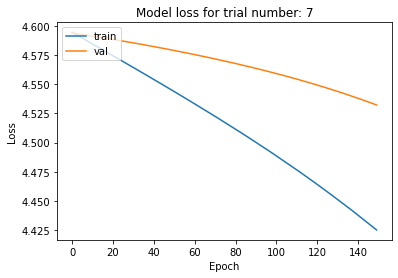

Evaluate the trial number: 7
7/7 [==============================] - 0s 2ms/step - loss: 4.4527 - accuracy: 0.1818


In [26]:
# trial 7
model = evaluate_our_model(400, 128, tf.keras.optimizers.Adadelta(learning_rate = 0.1, rho=0.95, epsilon=1e-07), 0, 7)

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 400)               77200     
                                                                 
 dropout_7 (Dropout)         (None, 400)               0         
                                                                 
 output (Dense)              (None, 99)                39699     
                                                                 
Total params: 116,899
Trainable params: 116,899
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
5/5 [==============================] - 0s 37ms/step - loss: 30.0048 - accuracy: 0.0363 - val_loss: 61.1891 - val_accuracy: 0.0063
Epoch 2/150
5/5 [==============================] - 0s 10ms/step - loss: 33.9457 - accuracy: 0.0695 - val_loss: 21.2551 - val_accuracy: 0.0943
Epoch 3/150
5/5 [===========

5/5 [==============================] - 0s 9ms/step - loss: 2.9416e-07 - accuracy: 1.0000 - val_loss: 0.8570 - val_accuracy: 0.9308
Epoch 53/150
5/5 [==============================] - 0s 10ms/step - loss: 2.5047e-07 - accuracy: 1.0000 - val_loss: 0.8556 - val_accuracy: 0.9308
Epoch 54/150
5/5 [==============================] - 0s 9ms/step - loss: 2.1337e-07 - accuracy: 1.0000 - val_loss: 0.8531 - val_accuracy: 0.9308
Epoch 55/150
5/5 [==============================] - 0s 9ms/step - loss: 1.8286e-07 - accuracy: 1.0000 - val_loss: 0.8522 - val_accuracy: 0.9308
Epoch 56/150
5/5 [==============================] - 0s 9ms/step - loss: 1.5518e-07 - accuracy: 1.0000 - val_loss: 0.8505 - val_accuracy: 0.9308
Epoch 57/150
5/5 [==============================] - 0s 9ms/step - loss: 1.3315e-07 - accuracy: 1.0000 - val_loss: 0.8489 - val_accuracy: 0.9308
Epoch 58/150
5/5 [==============================] - 0s 9ms/step - loss: 1.1751e-07 - accuracy: 1.0000 - val_loss: 0.8473 - val_accuracy: 0.9308
Epoc

Epoch 109/150
5/5 [==============================] - 0s 9ms/step - loss: 3.7853e-08 - accuracy: 1.0000 - val_loss: 1.4932 - val_accuracy: 0.8931
Epoch 110/150
5/5 [==============================] - 0s 8ms/step - loss: 3.2768e-08 - accuracy: 1.0000 - val_loss: 1.4888 - val_accuracy: 0.8931
Epoch 111/150
5/5 [==============================] - 0s 8ms/step - loss: 2.7684e-08 - accuracy: 1.0000 - val_loss: 1.4846 - val_accuracy: 0.8931
Epoch 112/150
5/5 [==============================] - 0s 9ms/step - loss: 2.4106e-08 - accuracy: 1.0000 - val_loss: 1.4822 - val_accuracy: 0.8931
Epoch 113/150
5/5 [==============================] - 0s 9ms/step - loss: 2.0716e-08 - accuracy: 1.0000 - val_loss: 1.4803 - val_accuracy: 0.8931
Epoch 114/150
5/5 [==============================] - 0s 10ms/step - loss: 1.8456e-08 - accuracy: 1.0000 - val_loss: 1.4753 - val_accuracy: 0.8931
Epoch 115/150
5/5 [==============================] - 0s 10ms/step - loss: 1.6761e-08 - accuracy: 1.0000 - val_loss: 1.4744 - val_

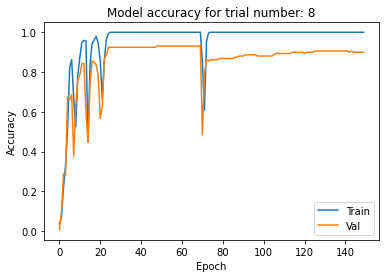

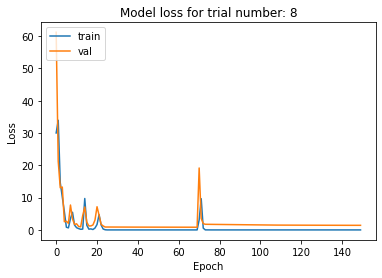

Evaluate the trial number: 8
7/7 [==============================] - 0s 2ms/step - loss: 0.8797 - accuracy: 0.9091


In [27]:
# trial 8
model = evaluate_our_model(400, 128, tf.keras.optimizers.RMSprop(learning_rate = 0.1,rho=0.9,momentum=0.0,epsilon=1e-07,centered=False), 0, 8)

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 400)               77200     
                                                                 
 dropout_8 (Dropout)         (None, 400)               0         
                                                                 
 output (Dense)              (None, 99)                39699     
                                                                 
Total params: 116,899
Trainable params: 116,899
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
5/5 [==============================] - 0s 31ms/step - loss: 4.5974 - accuracy: 0.0063 - val_loss: 4.5986 - val_accuracy: 0.0063
Epoch 2/150
5/5 [==============================] - 0s 8ms/step - loss: 4.5937 - accuracy: 0.0079 - val_loss: 4.6012 - val_accuracy: 0.0000e+00
Epoch 3/150
5/5 [============

5/5 [==============================] - 0s 8ms/step - loss: 4.3918 - accuracy: 0.2401 - val_loss: 4.5812 - val_accuracy: 0.0252
Epoch 53/150
5/5 [==============================] - 0s 8ms/step - loss: 4.3864 - accuracy: 0.2370 - val_loss: 4.5782 - val_accuracy: 0.0252
Epoch 54/150
5/5 [==============================] - 0s 8ms/step - loss: 4.3806 - accuracy: 0.2464 - val_loss: 4.5753 - val_accuracy: 0.0252
Epoch 55/150
5/5 [==============================] - 0s 8ms/step - loss: 4.3759 - accuracy: 0.2385 - val_loss: 4.5722 - val_accuracy: 0.0252
Epoch 56/150
5/5 [==============================] - 0s 8ms/step - loss: 4.3701 - accuracy: 0.2401 - val_loss: 4.5689 - val_accuracy: 0.0252
Epoch 57/150
5/5 [==============================] - 0s 8ms/step - loss: 4.3642 - accuracy: 0.2464 - val_loss: 4.5656 - val_accuracy: 0.0252
Epoch 58/150
5/5 [==============================] - 0s 8ms/step - loss: 4.3585 - accuracy: 0.2449 - val_loss: 4.5621 - val_accuracy: 0.0314
Epoch 59/150
5/5 [===============

5/5 [==============================] - 0s 10ms/step - loss: 3.8902 - accuracy: 0.3318 - val_loss: 4.2332 - val_accuracy: 0.1384
Epoch 111/150
5/5 [==============================] - 0s 10ms/step - loss: 3.8785 - accuracy: 0.3254 - val_loss: 4.2239 - val_accuracy: 0.1447
Epoch 112/150
5/5 [==============================] - 0s 10ms/step - loss: 3.8662 - accuracy: 0.3381 - val_loss: 4.2145 - val_accuracy: 0.1447
Epoch 113/150
5/5 [==============================] - 0s 10ms/step - loss: 3.8544 - accuracy: 0.3318 - val_loss: 4.2051 - val_accuracy: 0.1447
Epoch 114/150
5/5 [==============================] - 0s 10ms/step - loss: 3.8415 - accuracy: 0.3349 - val_loss: 4.1955 - val_accuracy: 0.1509
Epoch 115/150
5/5 [==============================] - 0s 11ms/step - loss: 3.8293 - accuracy: 0.3412 - val_loss: 4.1857 - val_accuracy: 0.1509
Epoch 116/150
5/5 [==============================] - 0s 10ms/step - loss: 3.8173 - accuracy: 0.3381 - val_loss: 4.1760 - val_accuracy: 0.1509
Epoch 117/150
5/5 [=

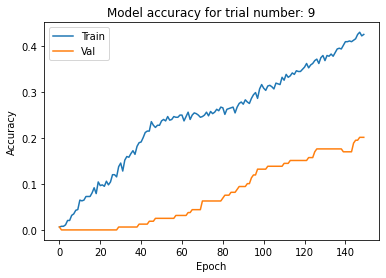

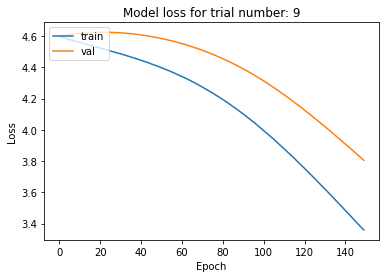

Evaluate the trial number: 9
7/7 [==============================] - 0s 2ms/step - loss: 3.4579 - accuracy: 0.3535


In [28]:
# trial 9
model = evaluate_our_model(400, 128, tf.keras.optimizers.Adagrad(learning_rate = 0.1,initial_accumulator_value=0.1,epsilon=1e-07), 0, 9)

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 400)               77200     
                                                                 
 dropout_9 (Dropout)         (None, 400)               0         
                                                                 
 output (Dense)              (None, 99)                39699     
                                                                 
Total params: 116,899
Trainable params: 116,899
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
5/5 [==============================] - 0s 33ms/step - loss: 4.5113 - accuracy: 0.1043 - val_loss: 4.3528 - val_accuracy: 0.2579
Epoch 2/150
5/5 [==============================] - 0s 9ms/step - loss: 3.9984 - accuracy: 0.4771 - val_loss: 3.8488 - val_accuracy: 0.3522
Epoch 3/150
5/5 [================

5/5 [==============================] - 0s 9ms/step - loss: 0.0077 - accuracy: 1.0000 - val_loss: 0.3530 - val_accuracy: 0.8994
Epoch 54/150
5/5 [==============================] - 0s 9ms/step - loss: 0.0074 - accuracy: 1.0000 - val_loss: 0.3521 - val_accuracy: 0.8994
Epoch 55/150
5/5 [==============================] - 0s 9ms/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 0.3514 - val_accuracy: 0.8994
Epoch 56/150
5/5 [==============================] - 0s 10ms/step - loss: 0.0070 - accuracy: 1.0000 - val_loss: 0.3513 - val_accuracy: 0.8931
Epoch 57/150
5/5 [==============================] - 0s 10ms/step - loss: 0.0067 - accuracy: 1.0000 - val_loss: 0.3515 - val_accuracy: 0.9057
Epoch 58/150
5/5 [==============================] - 0s 9ms/step - loss: 0.0065 - accuracy: 1.0000 - val_loss: 0.3519 - val_accuracy: 0.9057
Epoch 59/150
5/5 [==============================] - 0s 9ms/step - loss: 0.0063 - accuracy: 1.0000 - val_loss: 0.3522 - val_accuracy: 0.9057
Epoch 60/150
5/5 [=============

5/5 [==============================] - 0s 9ms/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 0.3497 - val_accuracy: 0.8994
Epoch 112/150
5/5 [==============================] - 0s 9ms/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 0.3502 - val_accuracy: 0.8994
Epoch 113/150
5/5 [==============================] - 0s 9ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 0.3497 - val_accuracy: 0.8994
Epoch 114/150
5/5 [==============================] - 0s 9ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 0.3497 - val_accuracy: 0.8994
Epoch 115/150
5/5 [==============================] - 0s 9ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 0.3500 - val_accuracy: 0.8994
Epoch 116/150
5/5 [==============================] - 0s 9ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 0.3502 - val_accuracy: 0.8994
Epoch 117/150
5/5 [==============================] - 0s 9ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 0.3503 - val_accuracy: 0.8994
Epoch 118/150
5/5 [========

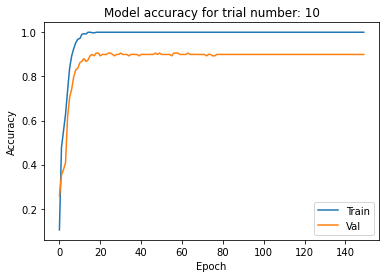

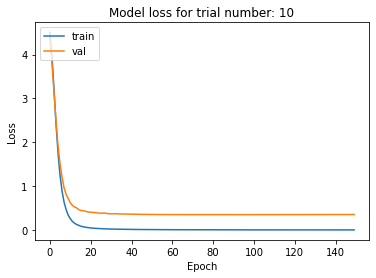

Evaluate the trial number: 10
7/7 [==============================] - 0s 2ms/step - loss: 0.1272 - accuracy: 0.9545


In [29]:
# trial 10
model = evaluate_our_model(400, 128, tf.keras.optimizers.Adam(learning_rate = 0.01), 0, 10)

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 400)               77200     
                                                                 
 dropout_10 (Dropout)        (None, 400)               0         
                                                                 
 output (Dense)              (None, 99)                39699     
                                                                 
Total params: 116,899
Trainable params: 116,899
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
10/10 [==============================] - 0s 18ms/step - loss: 4.5784 - accuracy: 0.0427 - val_loss: 4.5613 - val_accuracy: 0.0943
Epoch 2/150
10/10 [==============================] - 0s 6ms/step - loss: 4.5164 - accuracy: 0.2322 - val_loss: 4.5237 - val_accuracy: 0.1635
Epoch 3/150
10/10 [=========

Epoch 53/150
10/10 [==============================] - 0s 5ms/step - loss: 0.3735 - accuracy: 0.9795 - val_loss: 0.7676 - val_accuracy: 0.8491
Epoch 54/150
10/10 [==============================] - 0s 5ms/step - loss: 0.3597 - accuracy: 0.9795 - val_loss: 0.7541 - val_accuracy: 0.8491
Epoch 55/150
10/10 [==============================] - 0s 5ms/step - loss: 0.3459 - accuracy: 0.9826 - val_loss: 0.7397 - val_accuracy: 0.8428
Epoch 56/150
10/10 [==============================] - 0s 5ms/step - loss: 0.3333 - accuracy: 0.9858 - val_loss: 0.7272 - val_accuracy: 0.8428
Epoch 57/150
10/10 [==============================] - 0s 5ms/step - loss: 0.3230 - accuracy: 0.9858 - val_loss: 0.7087 - val_accuracy: 0.8428
Epoch 58/150
10/10 [==============================] - 0s 5ms/step - loss: 0.3101 - accuracy: 0.9858 - val_loss: 0.6976 - val_accuracy: 0.8491
Epoch 59/150
10/10 [==============================] - 0s 5ms/step - loss: 0.2996 - accuracy: 0.9858 - val_loss: 0.6886 - val_accuracy: 0.8428
Epoch 

10/10 [==============================] - 0s 5ms/step - loss: 0.0770 - accuracy: 1.0000 - val_loss: 0.4273 - val_accuracy: 0.9057
Epoch 111/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0755 - accuracy: 1.0000 - val_loss: 0.4270 - val_accuracy: 0.9057
Epoch 112/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0739 - accuracy: 1.0000 - val_loss: 0.4259 - val_accuracy: 0.9057
Epoch 113/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0723 - accuracy: 1.0000 - val_loss: 0.4227 - val_accuracy: 0.9119
Epoch 114/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0710 - accuracy: 1.0000 - val_loss: 0.4209 - val_accuracy: 0.9057
Epoch 115/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0698 - accuracy: 1.0000 - val_loss: 0.4182 - val_accuracy: 0.9057
Epoch 116/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0683 - accuracy: 1.0000 - val_loss: 0.4173 - val_accuracy: 0.9057
Epoch 117/150

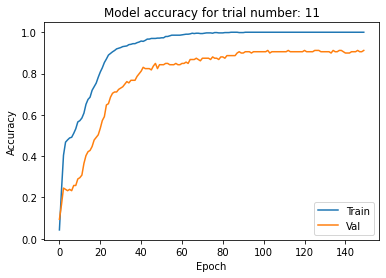

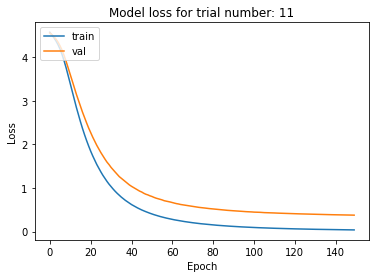

Evaluate the trial number: 11
7/7 [==============================] - 0s 2ms/step - loss: 0.1918 - accuracy: 0.9495


In [30]:
# trial 11
model = evaluate_our_model(400, 64, tf.keras.optimizers.Adam(learning_rate = 0.001), 0, 11)

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 400)               77200     
                                                                 
 dropout_11 (Dropout)        (None, 400)               0         
                                                                 
 output (Dense)              (None, 99)                39699     
                                                                 
Total params: 116,899
Trainable params: 116,899
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
10/10 [==============================] - 0s 17ms/step - loss: 4.5942 - accuracy: 0.0126 - val_loss: 4.5926 - val_accuracy: 0.0189
Epoch 2/150
10/10 [==============================] - 0s 5ms/step - loss: 4.5881 - accuracy: 0.0237 - val_loss: 4.5891 - val_accuracy: 0.0377
Epoch 3/150
10/10 [=========

Epoch 53/150
10/10 [==============================] - 0s 6ms/step - loss: 4.1607 - accuracy: 0.5340 - val_loss: 4.2891 - val_accuracy: 0.2642
Epoch 54/150
10/10 [==============================] - 0s 5ms/step - loss: 4.1471 - accuracy: 0.5371 - val_loss: 4.2787 - val_accuracy: 0.2642
Epoch 55/150
10/10 [==============================] - 0s 5ms/step - loss: 4.1334 - accuracy: 0.5419 - val_loss: 4.2684 - val_accuracy: 0.2642
Epoch 56/150
10/10 [==============================] - 0s 5ms/step - loss: 4.1194 - accuracy: 0.5419 - val_loss: 4.2578 - val_accuracy: 0.2642
Epoch 57/150
10/10 [==============================] - 0s 5ms/step - loss: 4.1053 - accuracy: 0.5434 - val_loss: 4.2472 - val_accuracy: 0.2642
Epoch 58/150
10/10 [==============================] - 0s 6ms/step - loss: 4.0910 - accuracy: 0.5419 - val_loss: 4.2362 - val_accuracy: 0.2642
Epoch 59/150
10/10 [==============================] - 0s 5ms/step - loss: 4.0763 - accuracy: 0.5434 - val_loss: 4.2250 - val_accuracy: 0.2642
Epoch 

10/10 [==============================] - 0s 5ms/step - loss: 3.2014 - accuracy: 0.6319 - val_loss: 3.5281 - val_accuracy: 0.3522
Epoch 111/150
10/10 [==============================] - 0s 6ms/step - loss: 3.1842 - accuracy: 0.6351 - val_loss: 3.5141 - val_accuracy: 0.3522
Epoch 112/150
10/10 [==============================] - 0s 6ms/step - loss: 3.1668 - accuracy: 0.6382 - val_loss: 3.4998 - val_accuracy: 0.3522
Epoch 113/150
10/10 [==============================] - 0s 6ms/step - loss: 3.1494 - accuracy: 0.6351 - val_loss: 3.4854 - val_accuracy: 0.3585
Epoch 114/150
10/10 [==============================] - 0s 5ms/step - loss: 3.1323 - accuracy: 0.6414 - val_loss: 3.4708 - val_accuracy: 0.3648
Epoch 115/150
10/10 [==============================] - 0s 5ms/step - loss: 3.1152 - accuracy: 0.6367 - val_loss: 3.4566 - val_accuracy: 0.3711
Epoch 116/150
10/10 [==============================] - 0s 5ms/step - loss: 3.0980 - accuracy: 0.6398 - val_loss: 3.4424 - val_accuracy: 0.3711
Epoch 117/150

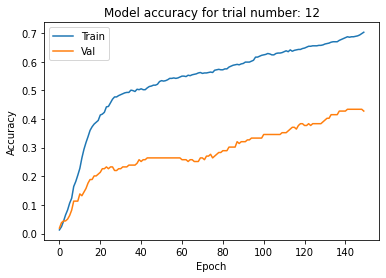

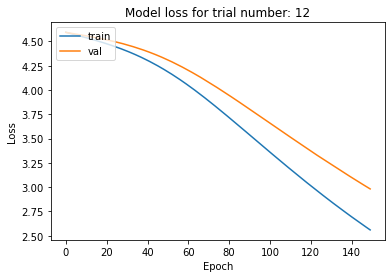

Evaluate the trial number: 12
7/7 [==============================] - 0s 2ms/step - loss: 2.6835 - accuracy: 0.5859


In [31]:
# trial 12
model = evaluate_our_model(400, 64, tf.keras.optimizers.Adam(learning_rate = 0.0001), 0, 12)

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 400)               77200     
                                                                 
 dropout_12 (Dropout)        (None, 400)               0         
                                                                 
 output (Dense)              (None, 99)                39699     
                                                                 
Total params: 116,899
Trainable params: 116,899
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
10/10 [==============================] - 0s 18ms/step - loss: 4.4593 - accuracy: 0.0932 - val_loss: 4.1887 - val_accuracy: 0.2579
Epoch 2/150
10/10 [==============================] - 0s 6ms/step - loss: 3.5593 - accuracy: 0.4455 - val_loss: 3.2614 - val_accuracy: 0.3648
Epoch 3/150
10/10 [=========

Epoch 53/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0053 - accuracy: 1.0000 - val_loss: 0.3372 - val_accuracy: 0.8994
Epoch 54/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0053 - accuracy: 1.0000 - val_loss: 0.3323 - val_accuracy: 0.8931
Epoch 55/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0049 - accuracy: 1.0000 - val_loss: 0.3344 - val_accuracy: 0.8994
Epoch 56/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 0.3391 - val_accuracy: 0.9057
Epoch 57/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 0.3379 - val_accuracy: 0.9057
Epoch 58/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0045 - accuracy: 1.0000 - val_loss: 0.3419 - val_accuracy: 0.9057
Epoch 59/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0041 - accuracy: 1.0000 - val_loss: 0.3450 - val_accuracy: 0.8994
Epoch 

10/10 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 0.3393 - val_accuracy: 0.9057
Epoch 111/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.3406 - val_accuracy: 0.8994
Epoch 112/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.3416 - val_accuracy: 0.9057
Epoch 113/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.3424 - val_accuracy: 0.9057
Epoch 114/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.3432 - val_accuracy: 0.9057
Epoch 115/150
10/10 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 1.00 - 0s 5ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.3439 - val_accuracy: 0.9057
Epoch 116/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0

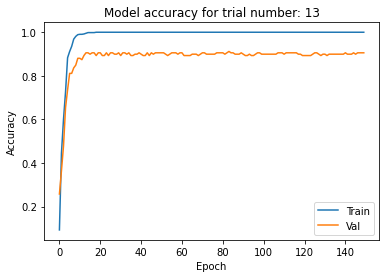

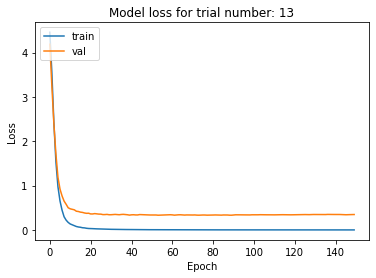

Evaluate the trial number: 13
7/7 [==============================] - 0s 2ms/step - loss: 0.1294 - accuracy: 0.9596


In [32]:
# trial 13
model = evaluate_our_model(400, 64, tf.keras.optimizers.Adam(learning_rate = 0.01), 0.2, 13)

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 400)               77200     
                                                                 
 dropout_13 (Dropout)        (None, 400)               0         
                                                                 
 output (Dense)              (None, 99)                39699     
                                                                 
Total params: 116,899
Trainable params: 116,899
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
10/10 [==============================] - 0s 16ms/step - loss: 4.4894 - accuracy: 0.0742 - val_loss: 4.3000 - val_accuracy: 0.1824
Epoch 2/150
10/10 [==============================] - 0s 5ms/step - loss: 3.7681 - accuracy: 0.2891 - val_loss: 3.4925 - val_accuracy: 0.2893
Epoch 3/150
10/10 [=========

Epoch 53/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0079 - accuracy: 1.0000 - val_loss: 0.3247 - val_accuracy: 0.9182
Epoch 54/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0082 - accuracy: 1.0000 - val_loss: 0.3180 - val_accuracy: 0.9119
Epoch 55/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0077 - accuracy: 1.0000 - val_loss: 0.3237 - val_accuracy: 0.9182
Epoch 56/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0070 - accuracy: 1.0000 - val_loss: 0.3337 - val_accuracy: 0.9119
Epoch 57/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0074 - accuracy: 1.0000 - val_loss: 0.3322 - val_accuracy: 0.9057
Epoch 58/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0064 - accuracy: 1.0000 - val_loss: 0.3326 - val_accuracy: 0.9057
Epoch 59/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0058 - accuracy: 1.0000 - val_loss: 0.3255 - val_accuracy: 0.9119
Epoch 

10/10 [==============================] - 0s 5ms/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 0.3275 - val_accuracy: 0.9119
Epoch 111/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 0.3384 - val_accuracy: 0.9057
Epoch 112/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 0.3388 - val_accuracy: 0.9182
Epoch 113/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 0.3337 - val_accuracy: 0.9182
Epoch 114/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 0.3312 - val_accuracy: 0.9182
Epoch 115/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 0.3276 - val_accuracy: 0.9182
Epoch 116/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 0.3266 - val_accuracy: 0.9245
Epoch 117/150

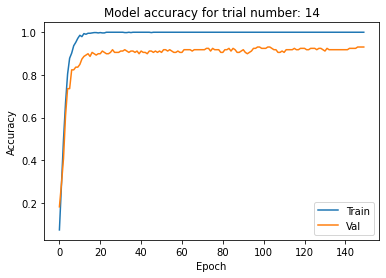

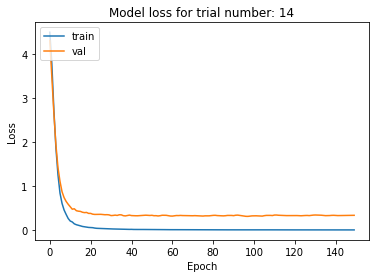

Evaluate the trial number: 14
7/7 [==============================] - 0s 2ms/step - loss: 0.1048 - accuracy: 0.9596


In [33]:
# trial 14
model = evaluate_our_model(400, 64, tf.keras.optimizers.Adam(learning_rate = 0.01), 0.4, 14)

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 400)               77200     
                                                                 
 dropout_14 (Dropout)        (None, 400)               0         
                                                                 
 output (Dense)              (None, 99)                39699     
                                                                 
Total params: 116,899
Trainable params: 116,899
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
10/10 [==============================] - 0s 17ms/step - loss: 4.5064 - accuracy: 0.0742 - val_loss: 4.3248 - val_accuracy: 0.1950
Epoch 2/150
10/10 [==============================] - 0s 6ms/step - loss: 3.8509 - accuracy: 0.3412 - val_loss: 3.6765 - val_accuracy: 0.2138
Epoch 3/150
10/10 [=========

Epoch 53/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0108 - accuracy: 1.0000 - val_loss: 0.3198 - val_accuracy: 0.9119
Epoch 54/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0105 - accuracy: 1.0000 - val_loss: 0.3161 - val_accuracy: 0.9119
Epoch 55/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0103 - accuracy: 1.0000 - val_loss: 0.3098 - val_accuracy: 0.9119
Epoch 56/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0101 - accuracy: 1.0000 - val_loss: 0.3071 - val_accuracy: 0.9119
Epoch 57/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0109 - accuracy: 1.0000 - val_loss: 0.3130 - val_accuracy: 0.9182
Epoch 58/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0092 - accuracy: 1.0000 - val_loss: 0.3123 - val_accuracy: 0.9057
Epoch 59/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0098 - accuracy: 1.0000 - val_loss: 0.3140 - val_accuracy: 0.9182
Epoch 

10/10 [==============================] - 0s 6ms/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 0.3200 - val_accuracy: 0.9119
Epoch 111/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 0.3211 - val_accuracy: 0.9119
Epoch 112/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 0.3152 - val_accuracy: 0.9245
Epoch 113/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 0.3134 - val_accuracy: 0.9182
Epoch 114/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 0.3119 - val_accuracy: 0.9119
Epoch 115/150
10/10 [==============================] - 0s 6ms/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 0.3097 - val_accuracy: 0.9245
Epoch 116/150
10/10 [==============================] - 0s 5ms/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 0.3055 - val_accuracy: 0.9245
Epoch 117/150

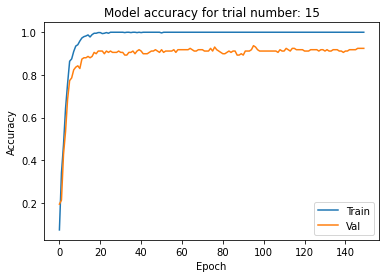

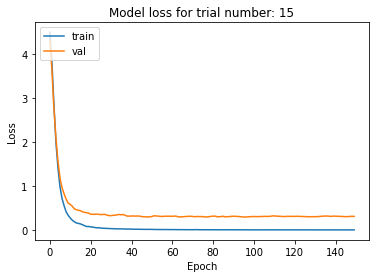

Evaluate the trial number: 15
7/7 [==============================] - 0s 2ms/step - loss: 0.1129 - accuracy: 0.9545


In [34]:
# trial 15
model = evaluate_our_model(400, 64, tf.keras.optimizers.Adam(learning_rate = 0.01), 0.5, 15)

# Our final model after tuning the parameters

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 400)               77200     
                                                                 
 dropout_16 (Dropout)        (None, 400)               0         
                                                                 
 output (Dense)              (None, 99)                39699     
                                                                 
Total params: 116,899
Trainable params: 116,899
Non-trainable params: 0
_________________________________________________________________
Epoch 1/150
5/5 [==============================] - 0s 32ms/step - loss: 4.5393 - accuracy: 0.0569 - val_loss: 4.4336 - val_accuracy: 0.1195
Epoch 2/150
5/5 [==============================] - 0s 11ms/step - loss: 4.1809 - accuracy: 0.2622 - val_loss: 4.1089 - val_accuracy: 0.2327
Epoch 3/150
5/5 [==============

5/5 [==============================] - 0s 10ms/step - loss: 0.0152 - accuracy: 1.0000 - val_loss: 0.3355 - val_accuracy: 0.9057
Epoch 54/150
5/5 [==============================] - 0s 10ms/step - loss: 0.0164 - accuracy: 1.0000 - val_loss: 0.3339 - val_accuracy: 0.9119
Epoch 55/150
5/5 [==============================] - 0s 11ms/step - loss: 0.0140 - accuracy: 1.0000 - val_loss: 0.3332 - val_accuracy: 0.9119
Epoch 56/150
5/5 [==============================] - 0s 9ms/step - loss: 0.0145 - accuracy: 1.0000 - val_loss: 0.3351 - val_accuracy: 0.9119
Epoch 57/150
5/5 [==============================] - 0s 10ms/step - loss: 0.0139 - accuracy: 1.0000 - val_loss: 0.3388 - val_accuracy: 0.9057
Epoch 58/150
5/5 [==============================] - 0s 10ms/step - loss: 0.0121 - accuracy: 1.0000 - val_loss: 0.3406 - val_accuracy: 0.9057
Epoch 59/150
5/5 [==============================] - 0s 10ms/step - loss: 0.0125 - accuracy: 1.0000 - val_loss: 0.3386 - val_accuracy: 0.9057
Epoch 60/150
5/5 [=========

5/5 [==============================] - 0s 11ms/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 0.3167 - val_accuracy: 0.9119
Epoch 112/150
5/5 [==============================] - 0s 10ms/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 0.3180 - val_accuracy: 0.9119
Epoch 113/150
5/5 [==============================] - 0s 11ms/step - loss: 0.0043 - accuracy: 1.0000 - val_loss: 0.3183 - val_accuracy: 0.9119
Epoch 114/150
5/5 [==============================] - 0s 11ms/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 0.3133 - val_accuracy: 0.9119
Epoch 115/150
5/5 [==============================] - 0s 10ms/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 0.3117 - val_accuracy: 0.9119
Epoch 116/150
5/5 [==============================] - 0s 10ms/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 0.3096 - val_accuracy: 0.9119
Epoch 117/150
5/5 [==============================] - 0s 11ms/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 0.3092 - val_accuracy: 0.9119
Epoch 118/150
5/5 [=

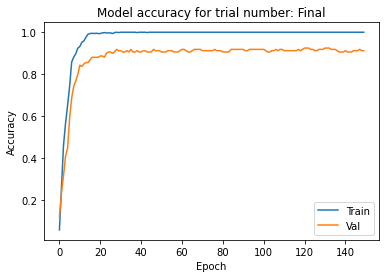

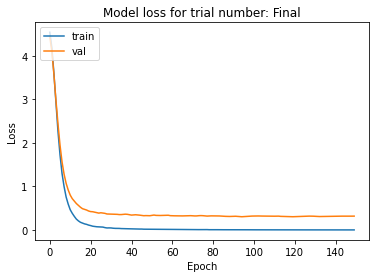

Evaluate the trial number: Final
7/7 [==============================] - 0s 2ms/step - loss: 0.1277 - accuracy: 0.9545


In [43]:
# Final model
model = evaluate_our_model(400, 128, tf.keras.optimizers.Adam(learning_rate = 0.01), 0.4, 'Final')

In [44]:
# get the predicted label for the test dataset after tuning the hyperparameters
y_prob = model.predict(X_test) 
y_classes = y_prob.argmax(axis=-1)
y_classes


array([ 2, 21, 81, 30, 79, 64, 85, 36, 27, 77, 25, 25, 76, 95, 33, 26, 11,
       42, 32, 88, 43, 60, 54, 93, 20, 73, 19, 82, 68, 14, 94, 89, 55, 17,
       95, 70, 69,  4, 27, 65, 13, 44,  7, 84, 61, 52, 37, 42, 60, 66, 57,
       46, 20, 61, 75, 38, 22, 80, 67, 88, 15, 67, 51, 32, 83, 52, 63, 43,
        5, 96, 87, 41, 23, 50,  4, 48, 91, 53, 91, 45,  9, 90, 96, 53, 47,
       21, 90, 58, 35, 97, 71, 50, 74,  3, 26, 63, 83, 44, 93, 86, 35, 65,
       87, 92,  8, 59, 11, 12, 31, 17, 30, 16, 71, 18, 84,  0,  1, 34, 28,
        9,  2, 75, 29, 50, 39, 23, 92, 46, 45, 62, 40, 13, 80, 41, 64, 15,
       57, 37, 72, 59,  7, 94, 70, 49,  1, 76, 12, 28, 86, 55, 66, 16, 69,
       78,  3, 62, 14,  6, 43, 59, 85, 58, 68, 72, 74, 95, 92, 33, 47, 73,
       92, 18, 39, 29, 77, 31, 36, 98, 34, 64, 54, 43, 48, 51,  8, 56, 77,
       22,  6, 98,  5, 38,  0, 49, 40, 79, 19, 78], dtype=int64)

# Try the model after tuning the parameters on Kaggle using the original test csv file

In [45]:
data_test = pd.read_csv('C:\\Users\\fatma\\Downloads\\project deep\\test.csv',index_col='id')
print('number of null values in data_test = ', data_test.isnull().any().sum())
print('number of duplicated values in data_test = ', data_test.duplicated().any().sum())

number of null values in data_test =  0
number of duplicated values in data_test =  0


In [46]:
classes=list(np.unique(data_train.species))
len(classes)

99

In [47]:
y_prob = model.predict(data_test) 

df = pd.DataFrame(y_prob, columns=classes)
df.insert(0, 'id', data_test.index)
df.reset_index()

,index,id,Acer_Capillipes,Acer_Circinatum,Acer_Mono,Acer_Opalus,Acer_Palmatum,Acer_Pictum,Acer_Platanoids,Acer_Rubrum,...,Salix_Fragilis,Salix_Intergra,Sorbus_Aria,Tilia_Oliveri,Tilia_Platyphyllos,Tilia_Tomentosa,Ulmus_Bergmanniana,Viburnum_Tinus,Viburnum_x_Rhytidophylloides,Zelkova_Serrata
0,0,4,5.107235e-10,1.355315e-11,1.775204e-12,6.513241e-05,2.309868e-12,2.656201e-11,4.181776e-09,1.196798e-11,...,2.404332e-11,6.641269e-08,6.210480e-09,1.537614e-10,2.644928e-06,5.845947e-09,6.522753e-14,3.208560e-10,9.667422e-10,2.958819e-10
1,1,7,2.001776e-10,2.081362e-08,3.442735e-09,5.629055e-07,1.001665e-10,3.081213e-07,3.718813e-06,3.980008e-09,...,3.573898e-11,6.847488e-10,7.547770e-10,1.167306e-09,1.078987e-09,2.816959e-07,9.118549e-13,4.927318e-08,4.993538e-11,5.069499e-06
2,2,9,1.600518e-08,9.994189e-01,3.519750e-09,1.050127e-11,3.381325e-04,1.568990e-11,5.508931e-10,2.367858e-09,...,3.021123e-09,2.519740e-13,5.457553e-12,2.765363e-12,4.970139e-14,9.258346e-11,1.067179e-10,2.924797e-16,3.724911e-15,3.505798e-05
3,3,12,2.544896e-09,7.101971e-05,1.126849e-12,1.007758e-11,2.324040e-10,1.188509e-12,1.804020e-05,8.513415e-10,...,2.918126e-10,2.506739e-14,5.041799e-07,5.134082e-12,5.181365e-07,3.787793e-05,4.133139e-05,2.481799e-12,5.657568e-13,4.978882e-06
4,4,13,1.445725e-10,1.259597e-10,1.605456e-18,4.471621e-15,7.701097e-11,1.126173e-16,2.544413e-09,1.227464e-14,...,2.225363e-09,4.771428e-17,1.064784e-08,2.840853e-13,2.584106e-06,1.069878e-07,1.408447e-06,1.066997e-14,2.541206e-13,3.471270e-14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,589,1576,2.720193e-07,9.989091e-01,2.086027e-08,9.301827e-11,5.071853e-04,4.520568e-12,7.498364e-10,2.907861e-09,...,4.327844e-09,2.154454e-12,1.572222e-10,1.506219e-11,1.235864e-12,3.110534e-10,7.246955e-10,9.478104e-16,1.271669e-13,6.915065e-05
590,590,1577,4.211379e-08,3.628070e-07,5.336009e-13,3.133133e-07,4.256742e-11,2.430833e-14,4.926043e-08,3.438117e-09,...,4.529699e-10,3.183508e-12,9.804206e-06,2.193374e-11,9.056648e-04,1.081348e-03,7.279751e-07,3.985681e-11,9.854180e-11,1.821011e-05
591,591,1579,1.091690e-06,4.460816e-09,4.484557e-09,1.576810e-11,1.998855e-09,5.226339e-11,5.329923e-13,9.084216e-12,...,1.547488e-13,1.308011e-13,1.054745e-10,1.719872e-10,1.388789e-11,2.426102e-14,1.055551e-15,7.862107e-09,2.149403e-11,4.532092e-09
592,592,1580,7.840004e-11,2.950705e-10,2.266563e-06,1.579684e-07,8.339253e-09,5.623163e-09,3.450880e-11,2.313673e-04,...,4.813909e-07,2.448796e-05,3.998523e-13,1.620818e-04,1.704570e-11,7.456777e-08,8.026510e-10,1.414662e-10,4.715966e-11,2.182448e-09


In [48]:
filename = 'Prediction.csv'
df.to_csv(filename,index=False)
print('Saved file: ' + filename)

Saved file: Prediction.csv
